<a href="https://colab.research.google.com/github/OlegBEZb/assesment_preparation/blob/main/Bank%20marketing%20dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [133]:
%%capture

!pip install scipy -U
!pip install auto-sklearn
!pip install pandas-profiling -U
!pip install MarkupSafe==2.0.1
!pip install category_encoders

In [2]:
import scipy
scipy.__version__

'1.7.3'

In [3]:
import sklearn
import category_encoders as ce

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import pandas as pd
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


The dataset [description](http://archive.ics.uci.edu/ml/datasets/Bank+Marketing).   
[First paper of 2011](https://core.ac.uk/download/pdf/55616194.pdf).   
[Second paper of 2014](https://core.ac.uk/download/pdf/55631291.pdf)

In [4]:
df = pd.read_csv('/content/bank_marketing_campaign.csv')
df.head()

,age,job,marital,education,default,housing,loan,balance,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,423.0,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,2868.0,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,1888.0,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,1113.0,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,451.0,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [5]:
df.shape

(41188, 22)

The task is valuable to assist managers in prioritizing and selecting the next customers to be contacted during bank
marketing campaigns.

In [6]:
target_col = 'y'

# EDA and Preprocessing

In [91]:
df.index.is_monotonic

True

In [7]:
df.rename(columns={'month': 'last_contact_month',
                   'contact': 'last_communication_type',
                   'day_of_week': 'last_contact_day_of_week',
                   'default': 'has_credit',
                   'housing': 'has_housing_loan',
                   'loan': 'has_personal_loan'}, inplace=True)

CAT_FEATURES = ['job', 'marital', 'education',
                'has_credit', 'has_housing_loan', 'has_personal_loan',
                'last_communication_type', 'last_contact_month', 
                'last_contact_day_of_week', 'poutcome']

## Profiling

In [3]:
from pandas_profiling import ProfileReport

In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


1.   Age is positively correlated with balance (that is happy to know)
2.   List item



In [41]:
df[target_col].value_counts(normalize=True)

no     0.887337
yes    0.112663
Name: y, dtype: float64

## Drop duplicates

In [ ]:
df[df.duplicated(keep=False)]

Thanks to pandas profiling, we founs several rows completely duplicates. There is no need to keep them

In [8]:
df.drop_duplicates(inplace=True)
df.shape

(41176, 22)

In [9]:
assert df[df.duplicated(keep=False)].empty

## Missing values handling

From the description we know that some of the missing values were replaced with specific values

## Target extraction, leaking features removal

11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

In [10]:
cols_to_drop = ['duration']

Within a campaign, the human agents execute phone calls to a list of clients to sell the deposit (outbound) or, if
meanwhile the client calls the contact-center for any other reason, he
is asked to subscribe the deposit (inbound). Thus, the result is a binary
unsuccessful or successful contact.

In [11]:
y = df[target_col].map({'no': 0, 'yes': 1})
X = df.drop([target_col] + cols_to_drop, axis=1)

In [12]:
y.value_counts()

0    36537
1     4639
Name: y, dtype: int64

In [94]:
y.value_counts(normalize=True)

0    0.887337
1    0.112663
Name: y, dtype: float64

Very similar to the values stated in https://core.ac.uk/download/pdf/55616194.pdf

## Train-val-test split

According to the description, the data is "ordered by date (from May 2008 to November 2010)". This doesn't let us shuffle the data. 

But in the [first paper of 2011](https://core.ac.uk/download/pdf/55616194.pdf) "the whole dataset
was randomly divided into training (2/3) and test (1/3)
sets".   

In the [second paper of 2014](https://core.ac.uk/download/pdf/55631291.pdf) it was fixed: "For evaluation purposes, a time ordered split was initially performed, where the records were divided into training (four years)
and test data (one year). The training data is used for feature and model
selection and includes all contacts executed up to June 2012, in a total of
51,651 examples. The test data is used for measuring the prediction capabilities of the selected data-driven model, including the most recent
1293 contacts, from July 2012 to June 2013."

In [66]:
df['month'].value_counts()

may    13767
jul     7169
aug     6176
jun     5318
nov     4100
apr     2631
oct      717
sep      570
mar      546
dec      182
Name: month, dtype: int64

In [139]:
df['last_contact_month'] = df['last_contact_month'].map({'jan': 0,
                                                           'feb': 1,
                                                            'mar': 2,
                                                            'apr': 3,
                                                            'may': 4,
                                                            'jun': 5,
                                                            'jul': 6,
                                                            'aug': 7,
                                                            'sep': 8,
                                                            'oct': 9,
                                                            'nov': 10,
                                                            'dec': 11})

In [140]:
def collapse_sequences(ls):
    output_ls = []
    for elem in ls:
        if elem not in output_ls:
            output_ls.append(elem)
        else: # if this element already in the output list
            if output_ls[-1] != elem: # we check that this is a new sequence of this value
                output_ls.append(elem)
    return output_ls

In [143]:
print(collapse_sequences(df['last_contact_month'].values))

[4, 5, 6, 7, 9, 10, 11, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 2, 3, 4, 5, 6, 7, 8, 9, 10]


here we easily see 2.5 years. We never have anything in Jan, Feb

In [121]:
last_year_day_index = df[(df['last_contact_month'] == 'dec') & ((df['last_contact_month'].shift(-1) == 'mar'))].index
df.loc[last_year_day_index]

,age,job,marital,education,has_credit,has_housing_loan,has_personal_loan,balance,last_communication_type,last_contact_month,last_contact_day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,last_contact_year
27689,44,blue-collar,married,basic.4y,no,yes,yes,635.0,telephone,dec,mon,119,1,999,0,nonexistent,-0.2,92.756,-45.9,3.053,5176.3,yes,2008.0
39129,59,management,married,university.degree,no,yes,no,1358.0,cellular,dec,thu,646,3,6,1,success,-3.0,92.713,-33.0,0.700,5023.5,no,NaN


In [152]:
df.loc[:last_year_day_index[0], 'last_contact_year'] = 2008
df.loc[last_year_day_index[0]+1: last_year_day_index[1], 'last_contact_year'] = 2009
df.loc[last_year_day_index[1]+1:, 'last_contact_year'] = 2010
df['last_contact_year'] = df['last_contact_year'].astype(int)

This may be shifted one year back as it's the prev campaign

In [153]:
df[['last_contact_year', 'last_contact_month']]

,last_contact_year,last_contact_month
0,2008,4
1,2008,4
2,2008,4
3,2008,4
4,2008,4
...,...,...
41183,2010,10
41184,2010,10
41185,2010,10
41186,2010,10


In [164]:
df['year_mon'] = df[['last_contact_year', 'last_contact_month']].apply(lambda x: str(x['last_contact_year']) + '_' + str(x['last_contact_month']).zfill(2), axis=1)
df['year_mon']

0        2008_04
1        2008_04
2        2008_04
3        2008_04
4        2008_04
          ...   
41183    2010_10
41184    2010_10
41185    2010_10
41186    2010_10
41187    2010_10
Name: year_mon, Length: 41176, dtype: object

In [180]:
year_mon_list = df['year_mon'].unique()
values = [df[df['year_mon'] == year_mon][target_col].value_counts(normalize=True).values for year_mon in year_mon_list]
label_distribs = np.array(values)
label_distribs.shape

(26, 2)

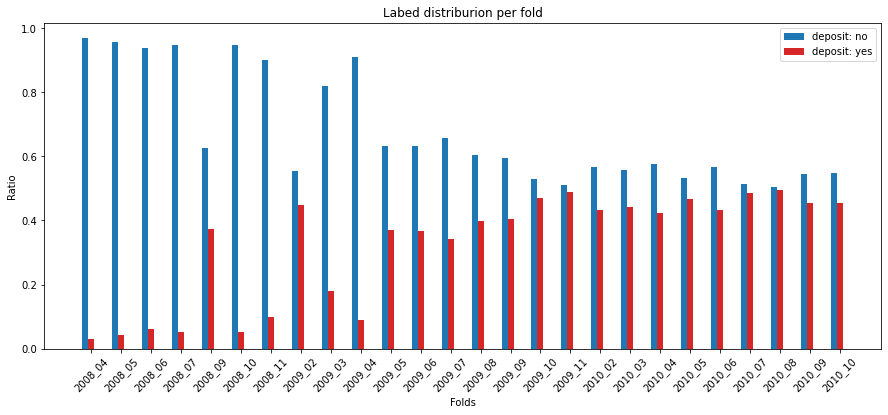

In [182]:
# create data
x = np.arange(label_distribs.shape[0])
width = 0.2
  
y0 = label_distribs[:, 0]
y1 = label_distribs[:, 1]

plt.figure(figsize=(15, 6))
plt.bar(x-0.2, y0, width, color='tab:blue')
plt.bar(x, y1, width, color='tab:red')
plt.xticks(x, year_mon_list, rotation=45)
plt.xlabel("Folds")
plt.ylabel("Ratio")
plt.legend(["deposit: no", "deposit: yes"])
plt.title('Labed distriburion per fold')
plt.show()

In [131]:
print(collapse_sequences(df['last_contact_day_of_week']))

['mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'wed', 'thu', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'wed', 'thu', 'fri', 'mon', 'wed', 'thu', 'fri', 'mon', 'tue', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue'

We do such a split without grouping into months as we rely on the sorting

In [13]:
from sklearn.model_selection import train_test_split

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.1, shuffle=False)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=len(y_test), shuffle=False)

X_train.shape, X_val.shape, X_test.shape

((32940, 20), (4118, 20), (4118, 20))

In [80]:
values = [df.value_counts(normalize=True).values for df in [y_train, y_val, y_test]]
label_distribs = np.array(values)
label_distribs

array([[0.93624772, 0.06375228],
       [0.8428849 , 0.1571151 ],
       [0.54055367, 0.45944633]])

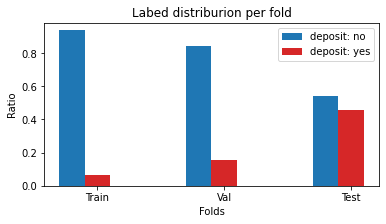

In [90]:
# create data
x = np.arange(label_distribs.shape[0])
width = 0.2
  
y0 = label_distribs[:, 0]
y1 = label_distribs[:, 1]

plt.figure(figsize=(6, 3))
plt.bar(x-0.2, y0, width, color='tab:blue')
plt.bar(x, y1, width, color='tab:red')
plt.xticks(x, ['Train', 'Val', 'Test'])
plt.xlabel("Folds")
plt.ylabel("Ratio")
plt.legend(["deposit: no", "deposit: yes"])
plt.title('Labed distriburion per fold')
plt.show()

In [93]:
assert X_train.index.is_monotonic_increasing
assert X_val.index.is_monotonic_increasing
assert X_test.index.is_monotonic_increasing

In [14]:
assert X_train.index.intersection(X_val.index).empty
assert X_train.index.intersection(X_test.index).empty
assert X_val.index.intersection(X_test.index).empty

## Feature engineering

In [ ]:
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
diff
14 - previous: number of contacts performed before this campaign and for this client (numeric)

In [ ]:
poutcome * pdays

# Evaluation

Selecting between F1, ROC AUC, and PR AUC.  

The dataset is heavily imbalanced we mostly mostly care about the positive class -> ROC AUC is rejected.  The additional reason to go with F1 (or Fbeta) is that these metrics are easier to interpret and communicate to business stakeholders.  

Nevertheless, to provide some sort of comparison with the original papers, ROC AUC will be included but not treated as our target metric

In [63]:
def eval(y_test, y_pred):
    clf_report = classification_report(y_test, y_pred, zero_division=0)

    print(clf_report)

    conf_matrix = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(conf_matrix, display_labels=np.unique(y_test))
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.grid(False)
    disp.plot(ax=ax)

# Modeling

## Baselines

### Majority baseline

              precision    recall  f1-score   support

           0       0.94      1.00      0.97     30840
           1       0.00      0.00      0.00      2100

    accuracy                           0.94     32940
   macro avg       0.47      0.50      0.48     32940
weighted avg       0.88      0.94      0.91     32940



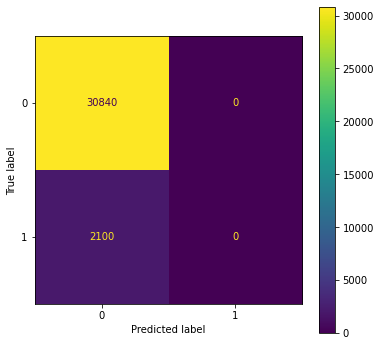

In [64]:
eval(y_train, [0] * len(y_train))

              precision    recall  f1-score   support

           0       0.54      1.00      0.70      2226
           1       0.00      0.00      0.00      1892

    accuracy                           0.54      4118
   macro avg       0.27      0.50      0.35      4118
weighted avg       0.29      0.54      0.38      4118



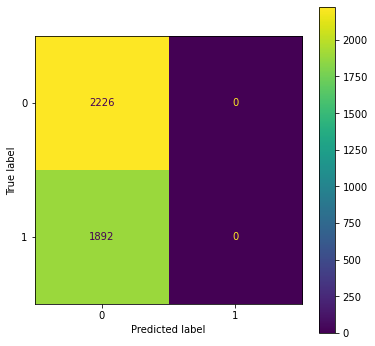

In [65]:
eval(y_test, [0] * len(y_test))

### Random baseline

              precision    recall  f1-score   support

           0       0.55      0.51      0.53      2226
           1       0.47      0.51      0.49      1892

    accuracy                           0.51      4118
   macro avg       0.51      0.51      0.51      4118
weighted avg       0.51      0.51      0.51      4118



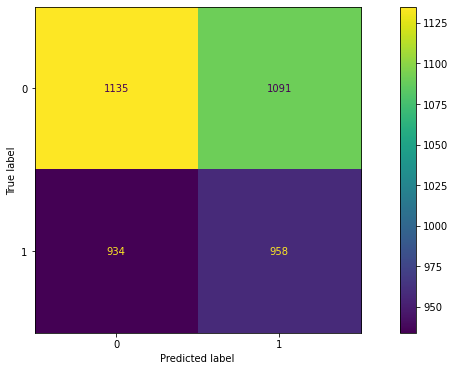

In [99]:
eval(y_test, np.random.choice([0, 1], size=len(y_test)))

### Log reg with dummy features baseline

In [39]:
enc = ce.OneHotEncoder(cols=CAT_FEATURES, 
                       use_cat_names=True)

X_train_val_enc = enc.fit_transform(X_train_val)
X_train_val_enc.head(3)

,age,job_housemaid,job_services,job_admin.,job_blue-collar,job_technician,job_retired,job_management,job_unemployed,job_self-employed,job_unknown,job_entrepreneur,job_student,marital_married,marital_single,marital_divorced,marital_unknown,education_basic.4y,education_high.school,education_basic.6y,education_basic.9y,education_professional.course,education_unknown,education_university.degree,education_illiterate,has_credit_no,has_credit_unknown,has_credit_yes,has_housing_loan_no,has_housing_loan_yes,has_housing_loan_unknown,has_personal_loan_no,has_personal_loan_yes,has_personal_loan_unknown,balance,last_communication_type_telephone,last_communication_type_cellular,last_contact_month_may,last_contact_month_jun,last_contact_month_jul,last_contact_month_aug,last_contact_month_oct,last_contact_month_nov,last_contact_month_dec,last_contact_month_mar,last_contact_month_apr,last_contact_day_of_week_mon,last_contact_day_of_week_tue,last_contact_day_of_week_wed,last_contact_day_of_week_thu,last_contact_day_of_week_fri,campaign,pdays,previous,poutcome_nonexistent,poutcome_failure,poutcome_success,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,423.0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,999,0,1,0,0,1.1,93.994,-36.4,4.857,5191.0
1,57,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,2868.0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,999,0,1,0,0,1.1,93.994,-36.4,4.857,5191.0
2,37,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1888.0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,999,0,1,0,0,1.1,93.994,-36.4,4.857,5191.0


In [42]:
corr = X_train_val_enc.corr()
corr.style.background_gradient(cmap='coolwarm')

,age,job_housemaid,job_services,job_admin.,job_blue-collar,job_technician,job_retired,job_management,job_unemployed,job_self-employed,job_unknown,job_entrepreneur,job_student,marital_married,marital_single,marital_divorced,marital_unknown,education_basic.4y,education_high.school,education_basic.6y,education_basic.9y,education_professional.course,education_unknown,education_university.degree,education_illiterate,has_credit_no,has_credit_unknown,has_credit_yes,has_housing_loan_no,has_housing_loan_yes,has_housing_loan_unknown,has_personal_loan_no,has_personal_loan_yes,has_personal_loan_unknown,balance,last_communication_type_telephone,last_communication_type_cellular,last_contact_month_may,last_contact_month_jun,last_contact_month_jul,last_contact_month_aug,last_contact_month_oct,last_contact_month_nov,last_contact_month_dec,last_contact_month_mar,last_contact_month_apr,last_contact_day_of_week_mon,last_contact_day_of_week_tue,last_contact_day_of_week_wed,last_contact_day_of_week_thu,last_contact_day_of_week_fri,campaign,pdays,previous,poutcome_nonexistent,poutcome_failure,poutcome_success,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
age,1.000000,0.075405,-0.058654,-0.088018,-0.007483,-0.056949,0.322261,0.072948,0.000397,0.009383,0.045983,0.040597,-0.158083,0.259762,-0.396047,0.156133,0.003624,0.212359,-0.101530,0.016312,-0.033060,-0.001736,0.075222,-0.060524,0.016192,-0.203234,0.203205,0.002548,0.002777,-0.003115,0.001133,0.006352,-0.007213,0.001133,0.177239,0.035951,-0.035951,-0.056226,0.008156,-0.037501,0.071057,-0.002805,0.035667,0.004248,-0.000239,0.014710,0.027174,0.018441,-0.027455,-0.029854,0.012192,0.013908,0.004524,-0.025348,0.027958,-0.026919,-0.006889,0.087501,0.057552,0.099461,0.095549,0.089254
job_housemaid,0.075405,1.000000,-0.054439,-0.092481,-0.091495,-0.072027,-0.027968,-0.044701,-0.024580,-0.030781,-0.014293,-0.031882,-0.018887,0.044442,-0.060426,0.015874,0.004554,0.177538,-0.021573,0.013734,-0.026025,-0.037852,0.001376,-0.057727,0.005273,-0.039096,0.039132,-0.001453,0.002653,-0.003504,0.002811,0.001123,-0.002383,0.002811,-0.025237,0.011077,-0.011077,-0.017998,0.001315,0.024742,0.024985,-0.002838,-0.013228,0.007785,-0.008224,-0.021675,0.004344,0.008895,0.003289,-0.009214,-0.007251,0.003994,0.008731,-0.020180,0.020733,-0.018939,-0.008146,0.050959,0.037730,0.041842,0.050278,0.049012
job_services,-0.058654,-0.054439,1.000000,-0.193023,-0.190964,-0.150331,-0.058374,-0.093298,-0.051303,-0.064246,-0.029832,-0.066543,-0.039421,-0.020508,0.004307,0.025852,-0.002725,-0.074506,0.356220,-0.002628,-0.053156,-0.073280,-0.003379,-0.183842,-0.006783,-0.009869,0.009936,-0.003033,0.004997,-0.005642,0.002163,-0.000166,-0.000742,0.002163,-0.094408,0.027601,-0.027601,0.050715,0.002013,0.017306,-0.074548,-0.008050,-0.018279,-0.005538,-0.025414,0.008354,0.000738,0.004650,-0.003787,-0.000025,-0.001575,-0.002647,0.007256,0.020690,-0.018842,0.021641,-0.005733,-0.016109,0.018423,-0.034510,-0.020425,-0.027001
job_admin.,-0.088018,-0.092481,-0.193023,1.000000,-0.324413,-0.255385,-0.099166,-0.158497,-0.087155,-0.109141,-0.050679,-0.113044,-0.066969,-0.126908,0.120524,0.026631,-0.005371,-0.177797,0.126315,-0.104619,-0.163768,-0.157316,-0.045133,0.322994,-0.008412,0.122256,-0.122160,-0.005152,-0.007747,0.010546,-0.009238,-0.014200,0.018972,-0.009238,-0.051390,-0.057802,0.057802,-0.050960,-0.014665,0.000219,0.081180,0.010982,0.004708,0.002022,0.010343,-0.005715,0.001269,-0.001919,-0.004378,-0.007123,0.012448,0.015865,-0.005853,-0.004841,0.003196,-0.005022,0.004981,-0.003681,-0.042825,0.022167,-0.001194,0.008818
job_blue-collar,-0.007483,-0.091495,-0.190964,-0.324413,1.000000,-0.252661,-0.098108,-0.156806,-0.086225,-0.107977,-0.050138,-0.111838,-0.066254,0.131595,-0.100241,-0.060662,-0.006421,0.284454,-0.188804,0.228806,0.370564,-0.136314,0.030855,-0.344869,0.013624,-0.163750,0.163879,-0.005098,0.010512,-0.012868,0.007818,0.003539,-0.007069,0.007818,-0.032567,0.078963,-0.078963,0.116726,0.022946,0.018418,-0.132331,-0.006338,

In [126]:
X_test_enc = enc.transform(X_test)
X_test_enc.shape

(4118, 62)

In [129]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

log_reg_baseline = make_pipeline(StandardScaler(), LogisticRegression())
log_reg_baseline.fit(X_train_val_enc, y_train_val)
log_reg_baseline_preds = log_reg_baseline.predict(X_test_enc)

              precision    recall  f1-score   support

           0       0.62      0.69      0.65      2226
           1       0.58      0.49      0.53      1892

    accuracy                           0.60      4118
   macro avg       0.60      0.59      0.59      4118
weighted avg       0.60      0.60      0.60      4118



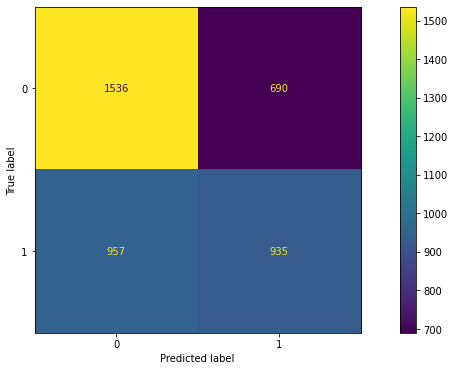

In [130]:
eval(y_test, log_reg_baseline_preds)

### AutoML

In [45]:
minutes_limit = 10

#### auto-sklearn on dummy features

In [46]:
enc = ce.OneHotEncoder(cols=CAT_FEATURES, 
                       use_cat_names=True)
X_train_enc = enc.fit_transform(X_train)
X_val_enc = enc.transform(X_val)
X_test_enc = enc.transform(X_test)

In [47]:
import autosklearn.classification
import sklearn
from autosklearn.metrics import balanced_accuracy, precision, recall, f1_macro, accuracy

automl = autosklearn.classification.AutoSklearnClassifier(
    time_left_for_this_task=60*minutes_limit,
    per_run_time_limit=None,
    memory_limit=5120, 
    ensemble_size=1,
    # tmp_folder='/tmp/autosklearn_resampling_example_tmp',
    disable_evaluator_output=False,
    # resampling_strategy=sklearn.model_selection.StratifiedKFold(),
    # resampling_strategy_arguments={'n_splits': 5},
    metric=f1_macro,
    scoring_functions=[balanced_accuracy, accuracy, precision, recall],
    # include={
    #     'classifier': [
    #         'decision_tree',# 'lda', 'sgd'
    #     ],
    #     'feature_preprocessor': [
    #         'no_preprocessing', #'polynomial', 'select_percentile_classification'
    #     ]
    # },
)
automl.fit(X_train_enc, y_train, X_test=X_val_enc, y_test=y_val)

AutoSklearnClassifier(ensemble_size=1, memory_limit=5120, metric=f1_macro,
                      per_run_time_limit=60,
                      scoring_functions=[balanced_accuracy, accuracy, precision,
                                         recall],
                      time_left_for_this_task=600)

In [48]:
print(automl.sprint_statistics())

auto-sklearn results:
  Dataset name: e110239e-d75a-11ec-8418-0242ac1c0002
  Metric: f1_macro
  Best validation score: 0.620101
  Number of target algorithm runs: 29
  Number of successful target algorithm runs: 18
  Number of crashed target algorithm runs: 1
  Number of target algorithms that exceeded the time limit: 4
  Number of target algorithms that exceeded the memory limit: 6



In [22]:
automl.leaderboard(detailed = True, ensemble_only=False).head()

,rank,ensemble_weight,type,cost,duration,config_id,train_loss,seed,start_time,end_time,budget,status,data_preprocessors,feature_preprocessors,balancing_strategy,config_origin
model_id,,,,,,,,,,,,,,,,
5,1,1.0,qda,0.384505,1.733154,4,0.387467,0,1.652954e+09,1.652954e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],weighting,Initial design
3,2,0.0,adaboost,0.446699,32.201789,2,0.372299,0,1.652954e+09,1.652954e+09,0.0,StatusType.SUCCESS,[],[feature_agglomeration],none,Initial design
2,3,0.0,random_forest,0.446955,23.656763,1,0.019119,0,1.652954e+09,1.652954e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Initial design
8,4,0.0,gradient_boosting,0.447913,18.947262,7,0.032471,0,1.652954e+09,1.652954e+09,0.0,StatusType.SUCCESS,[],[fast_ica],none,Initial design
6,5,0.0,mlp,0.466299,15.329882,5,0.433774,0,1.652954e+09,1.652954e+09,0.0,StatusType.SUCCESS,[],[select_rates_classification],weighting,Initial design


In [49]:
df_cv_results = pd.DataFrame(automl.cv_results_).sort_values(by = 'mean_test_score', ascending = False)
df_cv_results[[c for c in df_cv_results.columns if not c.startswith('param_')]].head()

,mean_test_score,metric_balanced_accuracy,metric_accuracy,metric_precision,metric_recall,mean_fit_time,params,rank_test_scores,status,budgets
27,0.620101,0.598913,0.926318,0.370813,0.223665,1.768040,"{'balancing:strategy': 'weighting', 'classifier:__choice__': 'qda', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:qda:reg_param': 0.27971892583411107, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'no_coalescense', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'median', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'none'}",1,Success,0.0
3,0.615495,0.609369,0.913163,0.295269,0.261183,1.750123,"{'balancing:strategy': 'weighting', 'classifier:__choice__': 'qda', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:qda:reg_param': 0.585497512341966, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'no_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'no_coalescense', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'standardize'}",2,Success,0.0
16,0.614465,0.592057,0.927330,0.374026,0.207792,46.455820,"{'balancing:strategy': 'weighting', 'classifier:__choice__': 'random_forest', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'feature_agglomeration', 'classifier:random_forest:bootstrap': 'True', 'classifier:random_forest:criterion': 'entropy', 'classifier:random_forest:max_depth': 'None', 'classifier:random_forest:max_features': 0.8368402974136906, 'classifier:random_forest:max_leaf_nodes': 'None', 'classifier:random_forest:min_impurity_decrease': 0.0, 'classifier:random_forest:min_samples_leaf': 2, 'classifier:random_forest:min_samples_split': 12, 'classifier:random_forest:min_weight_fraction_leaf': 0.0, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'median', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'minmax', 'feature_preprocessor:feature_agglomeration:affinity': 'euclidean', 'feature_preprocessor:feature_agglomeration:linkage': 'average', 'feature_preprocessor:feature_agglomeration:n_clusters': 316, 'feature_preprocessor:feature_agglomeration:pooling_func': 'median', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.007896625251873587}",3,Success,0.0
22,0.565367,0.557649,0.909484,0.211881,0.154401,17.408968,"{'balancing:strategy': 'weighting', 'classifier:__choice__': 'gradient_boosting', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'fast_ica', 'classifier:gradient_boosting:early_stop': 'valid', 'classifier:gradient_boosting:l2_regularization': 0.015551120980929202, 'classifier:gradient_boosting:learning_rate': 0.1412407637527763, 'classifier:gradient_boosting:loss': 'auto', 'classifier:gradient_boosting:max_bins': 255, 'classifier:gradient_boosting:max_depth': 'None', 'classifier:gradient_boosting:max_leaf_nodes': 581, 'classifier:gradient_boosting:min_samples_leaf': 1, 'classifier:gradient_boosting:scoring': 'loss', 'classifier:gradient_boosting:tol': 1e-07, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'no_co

Before re-fit
              precision    recall  f1-score   support

           0       0.64      0.77      0.70      2226
           1       0.64      0.49      0.55      1892

    accuracy                           0.64      4118
   macro avg       0.64      0.63      0.63      4118
weighted avg       0.64      0.64      0.63      4118



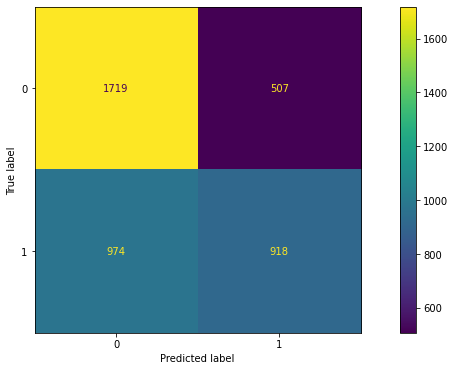

In [50]:
# One can use models trained during cross-validation directly to predict
# for unseen data. For this, all k models trained during k-fold
# cross-validation are considered as a single soft-voting ensemble inside
# the ensemble constructed with ensemble selection.
print('Before re-fit')
predictions = automl.predict(X_test_enc)
eval(y_test, predictions)

After re-fit
              precision    recall  f1-score   support

           0       0.64      0.77      0.70      2226
           1       0.64      0.49      0.55      1892

    accuracy                           0.64      4118
   macro avg       0.64      0.63      0.63      4118
weighted avg       0.64      0.64      0.63      4118



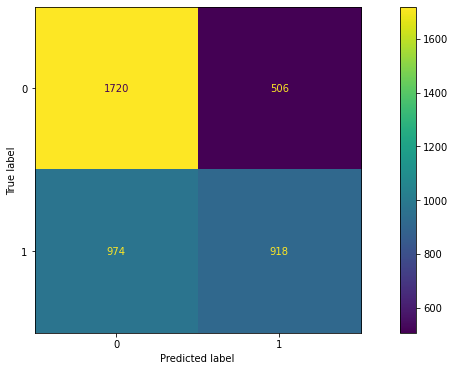

In [51]:
# During fit(), models are fit on individual cross-validation folds. To use all 
# available data, we call refit() which trains all models in the final 
# ensemble on the whole dataset.
print('After re-fit')
automl.refit(X_train_enc, y_train)
predictions = automl.predict(X_test_enc)
eval(y_test, predictions)

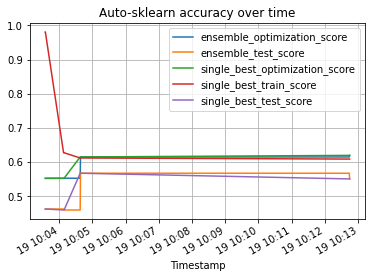

In [52]:
import matplotlib.pyplot as plt

automl.performance_over_time_.plot(
        x='Timestamp',
        kind='line',
        legend=True,
        title='Auto-sklearn accuracy over time',
        grid=True,
    )
plt.show()

In [53]:
import pprint

pp = pprint.PrettyPrinter(4)
pp.pprint(automl.show_models())

{   29: {   'balancing': Balancing(random_state=1, strategy='weighting'),
            'classifier': <autosklearn.pipeline.components.classification.ClassifierChoice object at 0x7fa6ac1d7c90>,
            'cost': 0.37989858314026836,
            'data_preprocessor': <autosklearn.pipeline.components.data_preprocessing.DataPreprocessorChoice object at 0x7fa6a7b78b50>,
            'ensemble_weight': 1.0,
            'feature_preprocessor': <autosklearn.pipeline.components.feature_preprocessing.FeaturePreprocessorChoice object at 0x7fa6a5535050>,
            'model_id': 29,
            'rank': 1,
            'sklearn_classifier': QuadraticDiscriminantAnalysis(reg_param=0.27971892583411107)}}


In [54]:
from sklearn.inspection import plot_partial_dependence, permutation_importance

r = permutation_importance(automl, X_val_enc, y_val, n_repeats=10, random_state=0)
sort_idx = r.importances_mean.argsort()[::-1]

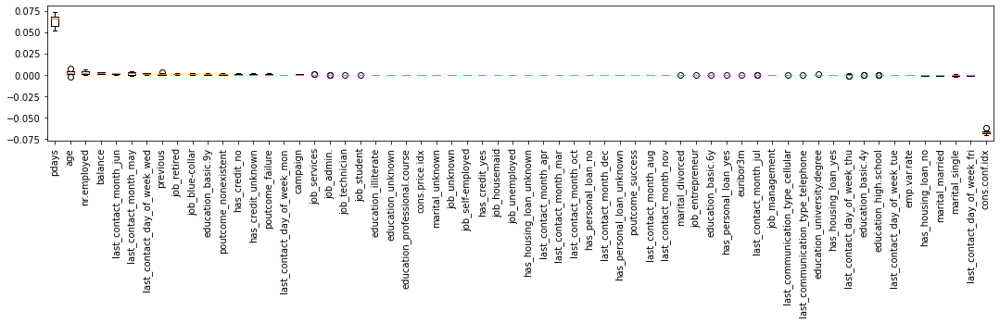

In [55]:
plt.figure(figsize=(15, 5))
plt.boxplot(r.importances[sort_idx].T,
            labels=[X_val_enc.columns[i] for i in sort_idx])

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [56]:
for i in sort_idx[::-1]:
    print(f"{X_val_enc.columns[i]:10s}: {r.importances_mean[i]:.3f} +/- "
          f"{r.importances_std[i]:.3f}")

cons.conf.idx: -0.067 +/- 0.002
last_contact_day_of_week_fri: -0.001 +/- 0.001
marital_single: -0.001 +/- 0.001
marital_married: -0.001 +/- 0.001
has_housing_loan_no: -0.000 +/- 0.000
emp.var.rate: -0.000 +/- 0.000
last_contact_day_of_week_tue: -0.000 +/- 0.000
education_high.school: -0.000 +/- 0.000
education_basic.4y: -0.000 +/- 0.000
last_contact_day_of_week_thu: -0.000 +/- 0.001
has_housing_loan_yes: -0.000 +/- 0.000
education_university.degree: -0.000 +/- 0.000
last_communication_type_telephone: -0.000 +/- 0.000
last_communication_type_cellular: -0.000 +/- 0.000
job_management: -0.000 +/- 0.000
last_contact_month_jul: -0.000 +/- 0.000
euribor3m : -0.000 +/- 0.000
has_personal_loan_yes: -0.000 +/- 0.000
education_basic.6y: -0.000 +/- 0.000
job_entrepreneur: -0.000 +/- 0.000
marital_divorced: -0.000 +/- 0.000
last_contact_month_nov: 0.000 +/- 0.000
last_contact_month_aug: 0.000 +/- 0.000
poutcome_success: 0.000 +/- 0.000
has_personal_loan_unknown: 0.000 +/- 0.000
last_contact_month_

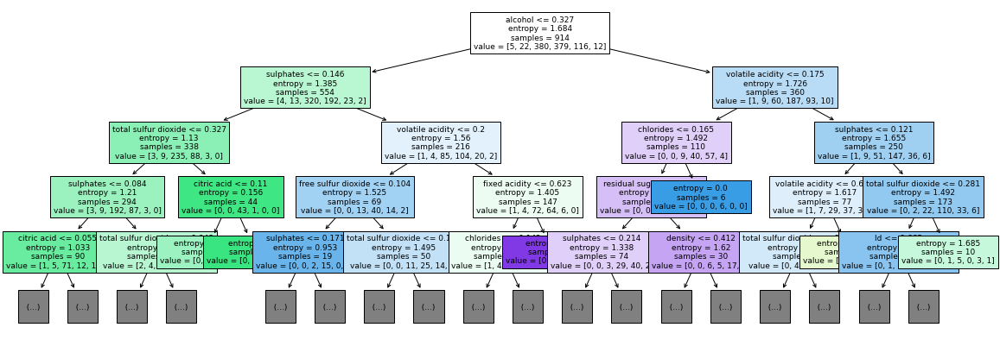

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from matplotlib import pyplot as plt

fig, axes = plt.subplots(nrows=1,
                        ncols=1,
                        figsize=(20, 7))

from sklearn import tree
tree.plot_tree(list(automl.show_models().values())[0]['sklearn_classifier'], 
               feature_names=X_test.columns, 
            #    class_names=automl.classes_
            filled=True,
            max_depth=4,
            fontsize=9,
               );

# SHAP importances

# Results

## Channels

## Biases

# Profit evaluation

In [ ]:
0.5 balance to deposit per year